In [ ]:
!pip install torchsummary

In [2]:
import os
import math
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

from mpl_toolkits.axes_grid1 import ImageGrid
from PIL import Image
import spacy
from textwrap import wrap
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn.utils.rnn import pad_sequence
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchsummary import summary
from torchvision import utils
from torchvision.io import read_image
import torchvision.models as models
import torchvision.transforms as T

In [3]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using {device} device")

Using cuda device


# Set Constants

In [4]:
# Data constants
data_dir = '/kaggle/input/flickr8k'
image_folder = os.path.join(data_dir, 'Images')
captions_file = os.path.join(data_dir, 'captions.txt')

BATCH_SIZE = 16
NUM_WORKERS = 4
SHUFFLE = True
PIN_MEMORY = True

In [5]:
# Model constants
EMBED_SIZE = 300    
ATTN_DIM = 256
DECODER_DIM = 512        
ENCODER_DIM = 2048

# Training constants
NUM_EPOCHS = 25    
LR = 5e-4
EARLY_STOPPING = True
ES_EPOCHS = 10
SAVE_PATH = os.path.join('/kaggle/working', 'best_model.pth')

# Exploratory Data Analysis (EDA)

In [6]:
# Read and explore captions file
captions_df = pd.read_csv(captions_file)
print("There are {} images".format(len(captions_df.image.unique())))
print("There are {} captions".format(len(captions_df)))
captions_df.head(10)

There are 8091 images
There are 40455 captions


,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...
5,1001773457_577c3a7d70.jpg,A black dog and a spotted dog are fighting
6,1001773457_577c3a7d70.jpg,A black dog and a tri-colored dog playing with...
7,1001773457_577c3a7d70.jpg,A black dog and a white dog with brown spots a...
8,1001773457_577c3a7d70.jpg,Two dogs of different breeds looking at each o...
9,1001773457_577c3a7d70.jpg,Two dogs on pavement moving toward each other .


In [7]:
def read_image(path, img_size=224):
    img = Image.open(path)
    img = img.resize((img_size,img_size))
    img = np.asarray(img)
    return img

In [8]:
# sample and display {num_samples} instances from dataset with caption 
def display_images(df, num_samples=16):
    dim = int(math.sqrt(num_samples))
    samples_df = df.sample(num_samples)
    samples_df = samples_df.reset_index(drop=True)

    fig = plt.figure(figsize=(20.,20.))
    grid = ImageGrid(fig, 111,
                     nrows_ncols=(dim, dim),
                     axes_pad=1.)
    
    for ax, i in zip(grid, range(num_samples)):
        image = read_image(os.path.join(image_folder, samples_df.image[i]))
        ax.set_title("\n".join(wrap(samples_df.caption[i], 40)), fontdict=None, loc='center', color = "k")
        ax.grid(False)
        ax.imshow(image)

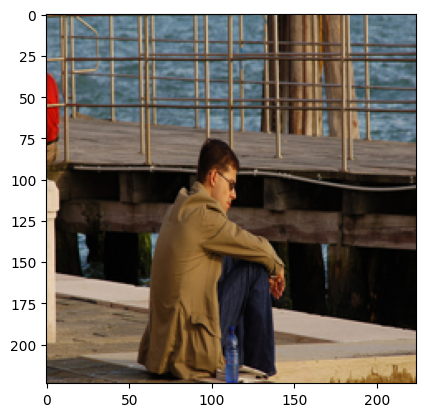

a lone man wearing sunglasses sitting on a concrete wall
A man sits by a dock looking at the water .
A man sits on a dock with a bottle of water .
Man sitting by himself on a pier with a bottle of water .
The man in the brown jacket is sitting on the ground by the jetty .


In [9]:
# Sample one instance and print all associated captions
sample_image = captions_df.sample(1).reset_index(drop=True)['image'][0]
sample_captions = captions_df.loc[captions_df['image'] == sample_image]['caption']

image = read_image(os.path.join(image_folder, sample_image))
plt.imshow(image)
plt.grid(False)
plt.show()

for caption in sample_captions:
    print(caption)

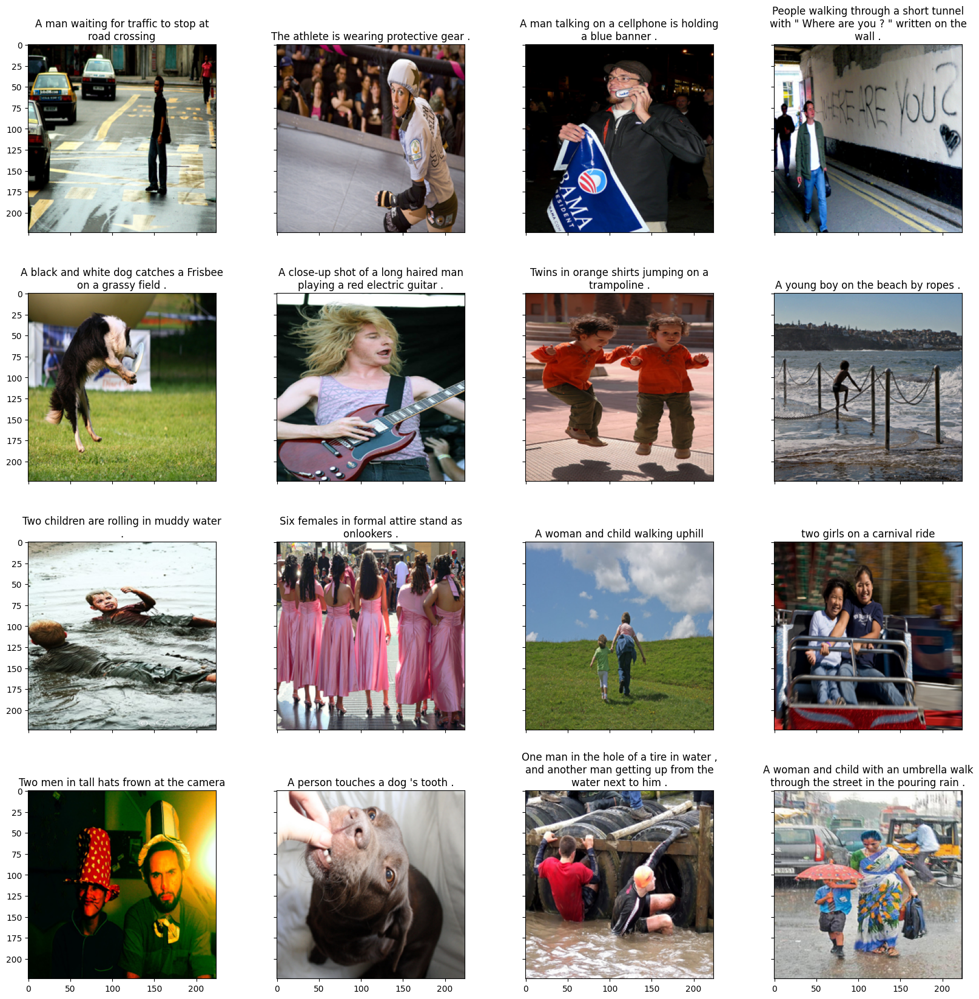

In [10]:
display_images(captions_df, 16)

# Data Processing

In [11]:
# Use spacy to help tokenize captions
spacy_eng = spacy.load("en_core_web_sm")

In [13]:
class Vocabulary:
    def __init__(self, freq_threshold=1):
        self.itos = {0:"<PAD>",1:"<SOS>", 2:"<EOS>", 3:"<UNK>"}
        self.stoi = {"<PAD>": 0, "<SOS>": 1, "<EOS>": 2, "<UNK>": 3}
        self.freq_threshold = freq_threshold
    
    def __len__(self):
        return len(self.itos)
    
    @staticmethod
    def tokenize(caption):
        return [token.text.lower() for token in spacy_eng.tokenizer(caption)]
    
    def build_vocabulary(self, caption_list):
        frequencies = {}
        idx = self.__len__()
        
        for caption in caption_list:
            for word in self.tokenize(caption):
                frequencies[word] = frequencies.get(word, 0) + 1
                
                if frequencies[word] == self.freq_threshold:
                    self.stoi[word] = idx
                    self.itos[idx] = word
                    idx += 1
        return frequencies
                    
    def numericalize(self, caption):
        tokenized_caption = self.tokenize(caption)
        return [
            self.stoi[token] if token in self.stoi else self.stoi["<UNK>"] for token in tokenized_caption
        ]

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


Text(0.5, 1.0, 'Top 50 most common words')

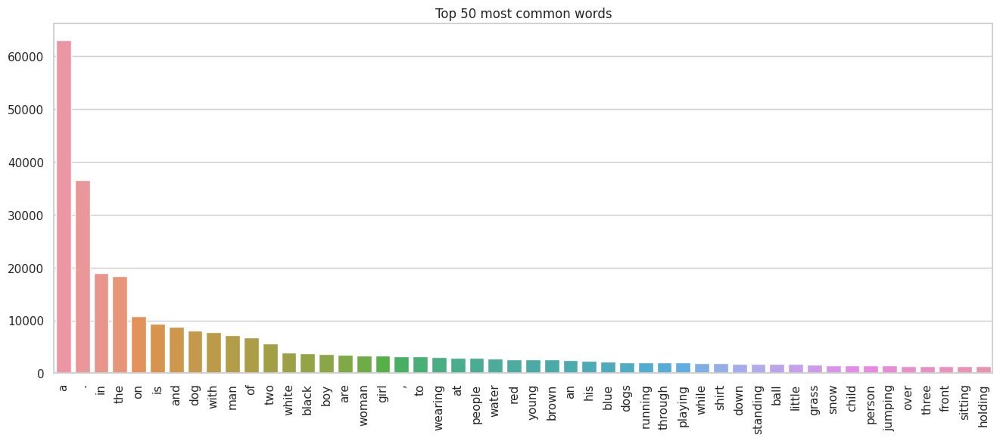

In [14]:
# Build Vocabulary
freq_threshold = 1 
captions = captions_df["caption"]
vocab = Vocabulary(freq_threshold)
frequencies = vocab.build_vocabulary(captions.tolist())

# plot most frequently appearing tokens/words 
frequencies = list(frequencies.items())
frequencies.sort(key=lambda x: x[1], reverse=True)
frequencies = frequencies[:50]
frequencies = {
    'x': [frequency[0] for frequency in frequencies],
    'y': [frequency[1] for frequency in frequencies]
}

sns.set(style='whitegrid')
plt.figure(figsize=(16,6))
sns.barplot(frequencies, x='x', y='y')
plt.xticks(rotation='vertical')
plt.title("Top 50 most common words")

In [16]:
# function to split dataset by {split_ratio} using images
def split_images(df, split_ratio):
    images = df['image'].unique().tolist()
    nimages = len(images)

    split_index = round(split_ratio*nimages)
    images1 = images[:split_index]
    images2 = images[split_index:]

    df1 = df[df['image'].isin(images1)]
    df2 = df[df['image'].isin(images2)]
    
    assert (len(set(df1['image']) - set(df2['image']))) == (len(set(df1['image'])))
    
    df1.reset_index(inplace=True,drop=True)
    df2.reset_index(inplace=True,drop=True)
    
    return df1, df2

In [17]:
class FlickrDataset(Dataset):
    def __init__(self, imgs_dir, df, vocab, transform=None, freq_threshold=1):
        self.imgs_dir = imgs_dir
        self.df = df
        self.vocab = vocab
        self.transform = transform
        
        self.imgs = self.df["image"]
        self.captions = self.df["caption"]
        
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, index):
        caption = self.captions[index]
        img_id = self.imgs[index]
        img = Image.open(os.path.join(self.imgs_dir, img_id)).convert("RGB")
        
        if self.transform is not None:
            img = self.transform(img)
            
        numericalized_caption = [self.vocab.stoi["<SOS>"]]
        numericalized_caption += self.vocab.numericalize(caption)
        numericalized_caption.append(self.vocab.stoi["<EOS>"])
        
        return img, torch.tensor(numericalized_caption)

In [18]:
# create train, test, and vaildatation datasets
train_df, test_df = split_images(captions_df, 0.8)
train_df, val_df = split_images(train_df, 0.8)

print("Train set: {}".format(len(train_df)))
print("Validation set: {}".format(len(val_df)))
print("Test set: {}".format(len(test_df)))

Train set: 25890
Validation set: 6475
Test set: 8090


In [19]:
# transform used for train and validation sets
transform = T.Compose([
    T.Resize((224,224)),
    T.ToTensor(),
    T.RandomHorizontalFlip(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]), # mean and std of Imagenet
])

# transform used for test set
test_transform = T.Compose([
    T.Resize((224,224)),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [20]:
train_dataset = FlickrDataset(image_folder, train_df, vocab, transform=transform)
val_dataset = FlickrDataset(image_folder, val_df, vocab, transform=transform)
test_dataset = FlickrDataset(image_folder, test_df, vocab, transform=test_transform)

In [21]:
class MyCollate:
    '''
    Collate to apply the padding to the captions
    '''
    def __init__(self, pad_idx):
        self.pad_idx = pad_idx

    def __call__(self, batch):
        imgs = [item[0].unsqueeze(0) for item in batch]
        imgs = torch.cat(imgs, dim=0)
        targets = [item[1] for item in batch]
        targets = pad_sequence(targets, batch_first=True, padding_value=self.pad_idx)

        return imgs, targets

In [22]:
pad_idx = train_dataset.vocab.stoi["<PAD>"]

train_loader = DataLoader(
    dataset=train_dataset,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKERS,
    shuffle=SHUFFLE,
    pin_memory=PIN_MEMORY,
    collate_fn=MyCollate(pad_idx=pad_idx),
)

val_loader = DataLoader(
    dataset=val_dataset,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKERS,
    shuffle=SHUFFLE,
    pin_memory=PIN_MEMORY,
    collate_fn=MyCollate(pad_idx=pad_idx),
)

test_loader = DataLoader(
    dataset=test_dataset,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKERS,
    shuffle=SHUFFLE,
    pin_memory=PIN_MEMORY,
    collate_fn=MyCollate(pad_idx=pad_idx),
)

In [25]:
# transform to denormalize image to visualize
inv_normalize = T.Compose([
    T.Normalize(
    mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
    std=[1/0.229, 1/0.224, 1/0.225]
)
])

In [26]:
# display images and captions from {data_loader}
def display_dl_images(data_loader, dataset):
    fig = plt.figure(figsize=(20.,20.))
    grid = ImageGrid(fig, 111,
                     nrows_ncols=(4, 4),
                     axes_pad=1.)
    
    dataiter = iter(data_loader)
    batch = next(dataiter)
    images, captions = batch
    
    for ax, i in zip(grid, range(20)):
        img, cap = images[i], captions[i]
        img = inv_normalize(img)
        caption_label = [dataset.vocab.itos[token] for token in cap.tolist()]
        
        eos_index = caption_label.index('<EOS>')
        caption_label = caption_label[1:eos_index]
        caption_label = ' '.join(caption_label)                      
        img = img.numpy().transpose((1, 2, 0))
        
        ax.set_title("\n".join(wrap(caption_label, 40)), fontdict=None, loc='center', color = "k")
        ax.grid(False)
        ax.imshow(img)

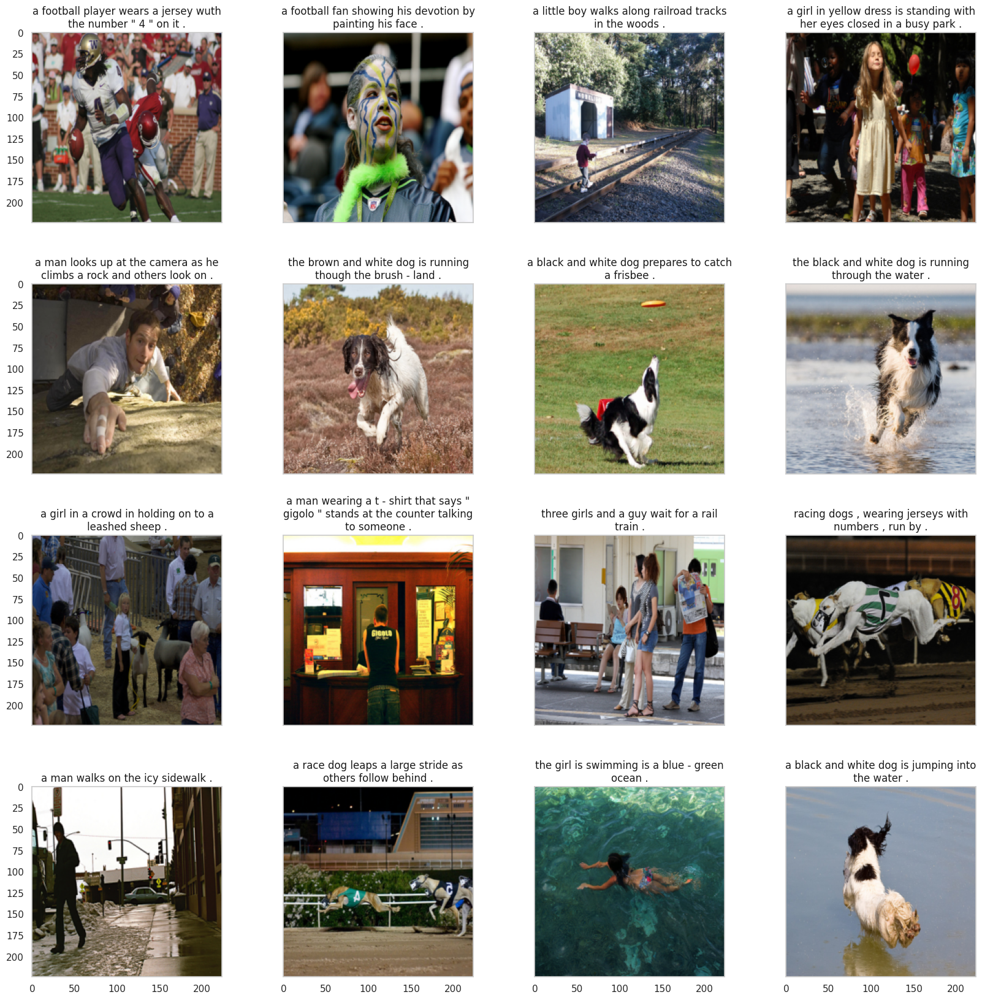

In [27]:
display_dl_images(train_loader, train_dataset)

# Model

In [28]:
# Encoder is a pre-trained ResNet50 CNN
class EncoderCNN(nn.Module):
    def __init__(self):
        super(EncoderCNN, self).__init__()
        resnet = models.resnet50(pretrained=True)
        for param in resnet.parameters():
            param.requires_grad_(False)
        
        modules = list(resnet.children())[:-2]
        self.resnet = nn.Sequential(*modules)
    
    
    def forward(self, images):
        features = self.resnet(images)          
        features = features.permute(0, 2, 3, 1)                          
        features = features.view(features.size(0), -1, features.size(-1))
        return features

In [29]:
# Local Attention (Bahdanau Attention)
class Attention(nn.Module):
    def __init__(self, encoder_dim, decoder_dim, attention_dim):
        super(Attention, self).__init__()
        self.encoder_att = nn.Linear(encoder_dim, attention_dim)  
        self.decoder_att = nn.Linear(decoder_dim, attention_dim)  
        self.full_att = nn.Linear(attention_dim, 1)  
        
        
    def forward(self, features, decoder_hidden):
        att1 = self.encoder_att(features) 
        att2 = self.decoder_att(decoder_hidden) 
        
        att = self.full_att(torch.tanh(att1 + att2.unsqueeze(1))).squeeze(2)  
        
        alpha = F.softmax(att, dim=1) 
        attention_weights = (features * alpha.unsqueeze(2)).sum(dim=1) 
        
        return alpha, attention_weights

In [30]:
# LSTM decoder with Attention
class DecoderRNN(nn.Module):
    def __init__(self, embed_size, encoder_dim, attention_dim, decoder_dim, vocab_size, dropout=0.5):
        super(DecoderRNN, self).__init__()
        
        self.embed_size = embed_size
        self.encoder_dim = encoder_dim
        self.attention_dim = attention_dim
        self.decoder_dim = decoder_dim
        self.vocab_size = vocab_size
        self.dropout = nn.Dropout(p=dropout)
        
        self.embedding = nn.Embedding(vocab_size, embed_size) 
        self.attention = Attention(encoder_dim, decoder_dim, attention_dim) 
        
        self.lstm_cell = nn.LSTMCell(embed_size + encoder_dim, decoder_dim, bias=True)  
        self.init_h = nn.Linear(encoder_dim, decoder_dim)  
        self.init_c = nn.Linear(encoder_dim, decoder_dim)  
        self.f_beta = nn.Linear(decoder_dim, encoder_dim) 
        
        self.fc = nn.Linear(decoder_dim, vocab_size)  
        
        
    def forward(self, features, captions):
        embed = self.embedding(captions)
        h, c = self.init_hidden(features)
        
        seq_len = len(captions[0])-1 
        batch_size, feature_size = features.size(0), features.size(1)
        
        outputs = torch.zeros(batch_size, seq_len, self.vocab_size).to(device)
        atten_weights = torch.zeros(batch_size, seq_len, feature_size).to(device)
        
        for s in range(seq_len):
            alpha, context = self.attention(features, h)
            lstm_input = torch.cat((embed[:, s], context), dim=1)
            h, c = self.lstm_cell(lstm_input, (h, c))
            
            output = self.fc(self.dropout(h))
            
            outputs[:,s] = output
            atten_weights[:,s] = alpha  
        
        return outputs, atten_weights

    
    def init_hidden(self, features):
        mean_features = features.mean(dim=1)
        h = self.init_h(mean_features)
        c = self.init_c(mean_features)
        return h, c

In [31]:
class EncoderDecoder(nn.Module):
    def __init__(self, embed_size, encoder_dim, attention_dim, decoder_dim, vocab_size, dropout=0.5):
        super(EncoderDecoder, self).__init__()
        self.encoder = EncoderCNN()
        self.decoder = DecoderRNN(
            embed_size=embed_size,
            attention_dim=attention_dim,
            encoder_dim=encoder_dim,
            decoder_dim=decoder_dim,
            vocab_size=vocab_size,
            dropout=dropout
        )
    
    def forward(self, images, captions):
        features = self.encoder(images)
        outputs = self.decoder(features, captions)
        return outputs
    
    def generate_caption(self, image, vocab, max_len=20):
        features = self.encoder(image)
        
        batch_size = features.size(0)
        h, c = self.decoder.init_hidden(features) 
        
        alphas = []
        result_caption = []

        word = torch.tensor(vocab.stoi['<SOS>']).view(1,-1).to(device)
        embeds = self.decoder.embedding(word)
        
        for _ in range(max_len):
            alpha, context = self.decoder.attention(features, h)
            alphas.append(alpha.cpu().detach().numpy())
            
            lstm_input = torch.cat((embeds[:, 0], context), dim=1)
            h, c = self.decoder.lstm_cell(lstm_input, (h, c))
            output = self.decoder.fc(self.decoder.dropout(h))
            output = output.view(batch_size,-1)
            
            predicted_word_idx = output.argmax(dim=1)
            result_caption.append(predicted_word_idx.item())
            
            if vocab.itos[predicted_word_idx.item()] == "<EOS>":
                break
            
            embeds = self.decoder.embedding(predicted_word_idx.unsqueeze(0))
        
        return [vocab.itos[idx] for idx in result_caption if vocab.itos[idx] not in ('<SOS>', ',', '.', '<EOS>', '<PAD>')], alphas

# Training

In [ ]:
vocab_size = len(vocab)

# create model
model = EncoderDecoder(
    embed_size=EMBED_SIZE,
    attention_dim=ATTN_DIM,
    decoder_dim=DECODER_DIM,
    encoder_dim=ENCODER_DIM,
    vocab_size=vocab_size
).to(device)

# create criterion and optimizer
criterion = nn.CrossEntropyLoss(ignore_index=train_dataset.vocab.stoi["<PAD>"])
optimizer = optim.AdamW(model.parameters(), lr=LR)

# caption = vocab.numericalize("A man running at the park")
# summary(model, [(3, 224, 224), caption])

In [33]:
class EarlyStopper:
    '''
    Stop training early if validation loss hasn't improved by {min_delta} for {patience} epochs
    '''
    def __init__(self, patience=1, min_delta=0.1):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.min_validation_loss = float('inf')

    def early_stop(self, validation_loss):
        if validation_loss < self.min_validation_loss:
            self.min_validation_loss = validation_loss
            self.counter = 0
        elif validation_loss > (self.min_validation_loss + self.min_delta):
            self.counter += 1
            if self.counter >= self.patience:
                return True
        return False

In [ ]:
model.train()

min_loss = float('inf')
if EARLY_STOPPING:
    early_stopper = EarlyStopper(patience=ES_EPOCHS, min_delta=0.1)

for epoch in range(1, NUM_EPOCHS+1):
    losses = []
    with tqdm(train_loader, unit="batch") as tepoch:
        for images, captions in tepoch:
            tepoch.set_description(f"Epoch {epoch}")
            images, captions = images.to(device), captions.to(device)

            outputs, attentions = model(images, captions)

            targets = captions[:,1:]
            loss = criterion(outputs.view(-1, vocab_size), targets.reshape(-1))
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            losses.append(loss.item())
            tepoch.set_postfix(loss=loss.item())
     
    print(f'Epoch {epoch} Training - Loss: {torch.tensor(losses).mean().item()}')
        
        
    losses = []
    with torch.no_grad():
        with tqdm(val_loader, unit="batch") as tepoch:
            for images, captions in tepoch:
                tepoch.set_description(f"Epoch {epoch}")
                images, captions = images.to(device), captions.to(device)

                outputs, attentions = model(images, captions)
                
                targets = captions[:,1:]
                loss = criterion(outputs.view(-1, vocab_size), targets.reshape(-1))

                losses.append(loss.item())
                tepoch.set_postfix(loss=loss.item())
            
            print(f'Epoch {epoch} Validation - Loss: {torch.tensor(losses).mean().item()}')
            loss = torch.tensor(losses).mean().item()
            
            if loss < min_loss:
                min_loss = loss
                torch.save(model.state_dict(), SAVE_PATH)
            if EARLY_STOPPING and early_stopper.early_stop(loss):             
                break

# Inference

In [35]:
model.load_state_dict(torch.load(SAVE_PATH))

<All keys matched successfully>

In [36]:
# convert numerical captions to captions
def convert_ids_to_words(ids):
    caption = [vocab.itos[idx] for idx in ids.numpy()]
    caption = [word for word in caption if word not in ('<SOS>', ',', '.', '<EOS>', '<PAD>')]
    return ' '.join(caption)

In [37]:
# function to predict a caption given an image
def predict_caption(model, image):
    model.eval()
    with torch.no_grad():
        caption, alphas = model.generate_caption(image.unsqueeze(0).to(device),vocab=vocab)
        return caption, alphas

In [38]:
# visualize attention
def plot_attention(img, result, attention_plot):
    img = img.numpy().transpose((1, 2, 0))
    temp_image = img

    fig = plt.figure(figsize=(15, 15))

    len_result = len(result)
    for l in range(len_result):
        temp_att = attention_plot[l].reshape(7,7)
        
        ax = fig.add_subplot(len_result//2,len_result//2, l+1)
        ax.set_title(result[l])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.7, extent=img.get_extent())
        ax.grid(False)

    plt.tight_layout()
    plt.show()

In [39]:
# sample a random instance from {data_loader} and display the prediction and attention maps
def inference_sample(data_loader):
    images, caption = next(iter(data_loader))
    img = images[0].detach().clone()
    img = inv_normalize(img)
    img1 = images[0].detach().clone()
    img1 = inv_normalize(img1)

    pred_caption_list, attns = predict_caption(model, img)
    pred_caption = ' '.join(pred_caption_list)
    true_caption = convert_ids_to_words(caption[0])
    
    print('TRUE:', true_caption)
    print('PRED:', pred_caption)
    
    plt.imshow(np.squeeze(img.numpy().transpose((1,2,0))))
    plt.grid(False)
    plt.show()
    
    plot_attention(img1, pred_caption_list, attns)

TRUE: two little boys play football on green grass
PRED: a boy in a blue shirt is playing with a ball in a field


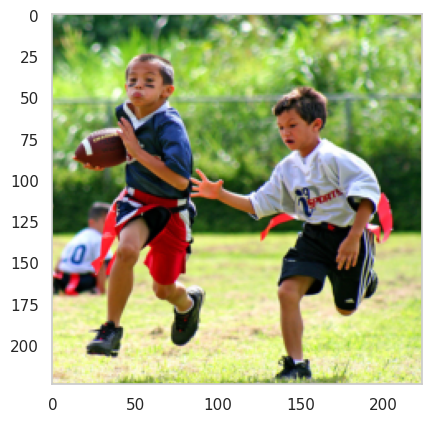

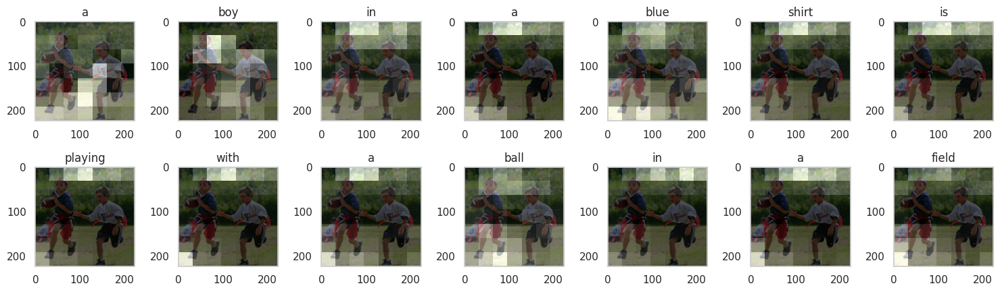

In [41]:
inference_sample(test_loader)

TRUE: a person is standing in the ocean fully clothed holding a fishing pole in one hand and a tackle box in the other
PRED: a man is standing on a beach


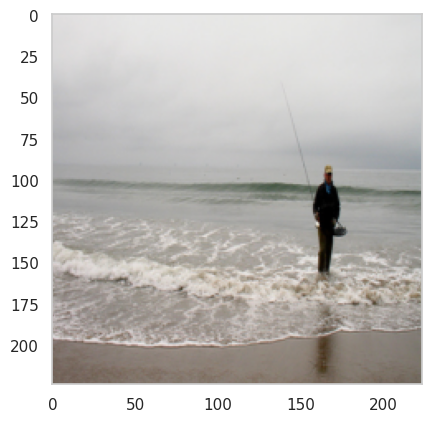

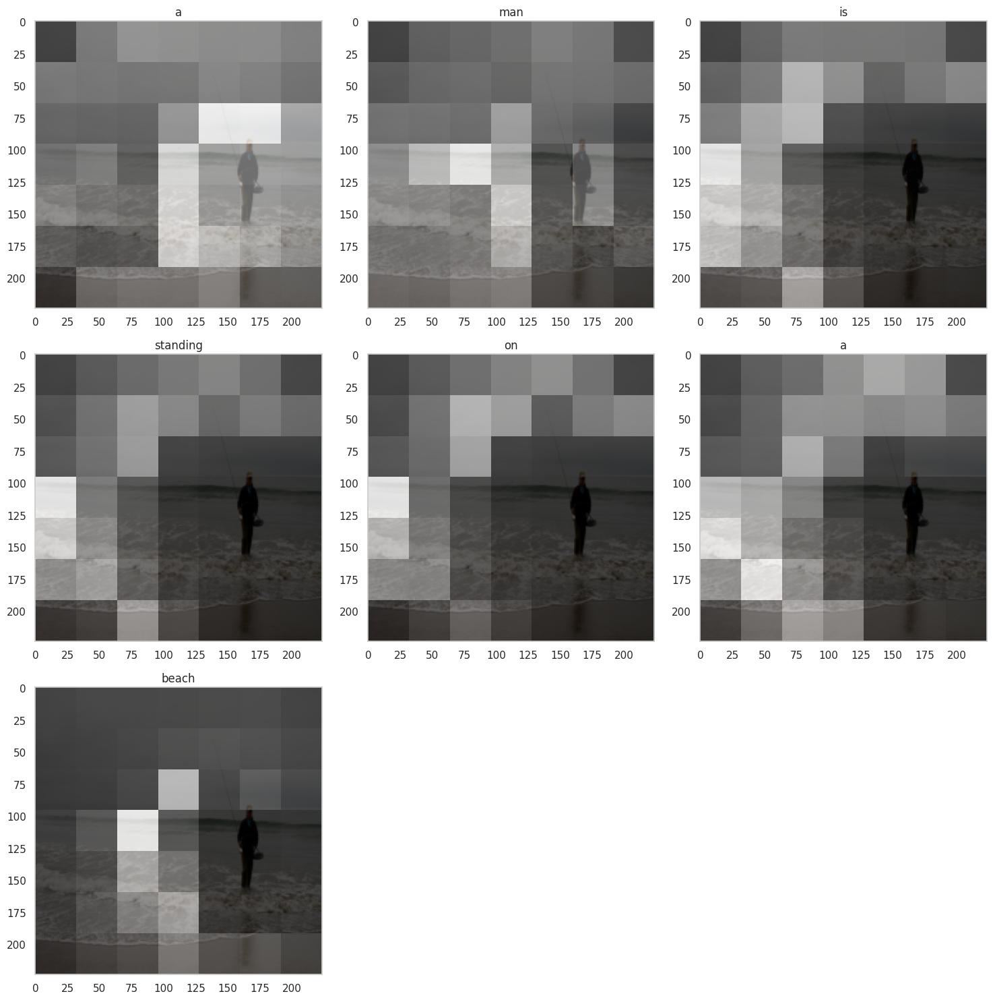

In [43]:
inference_sample(test_loader)

TRUE: a black and white dog is carrying a stick in a field
PRED: a white dog is running through the grass


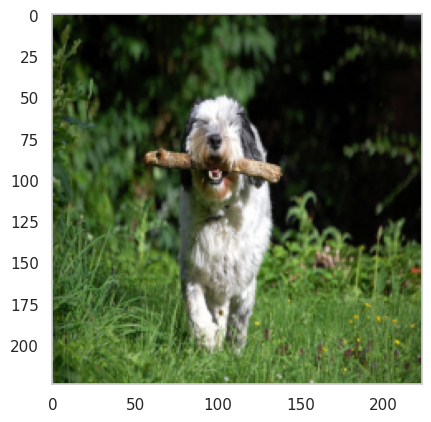

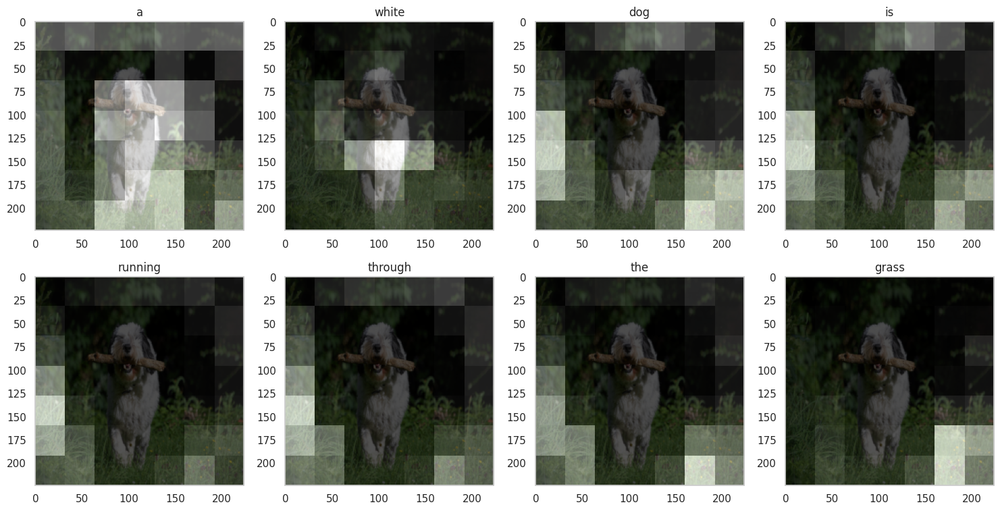

In [44]:
inference_sample(test_loader)

TRUE: four boys kneeling next to each other with a ball in front of them
PRED: a man in a blue shirt is holding a basketball in a game


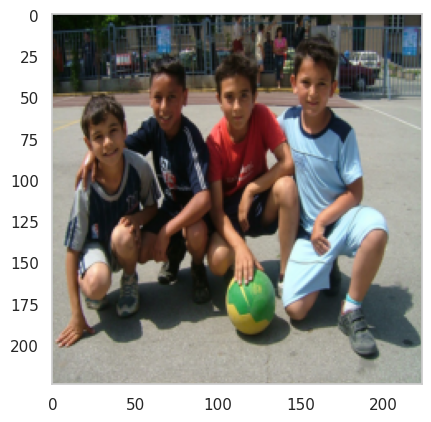

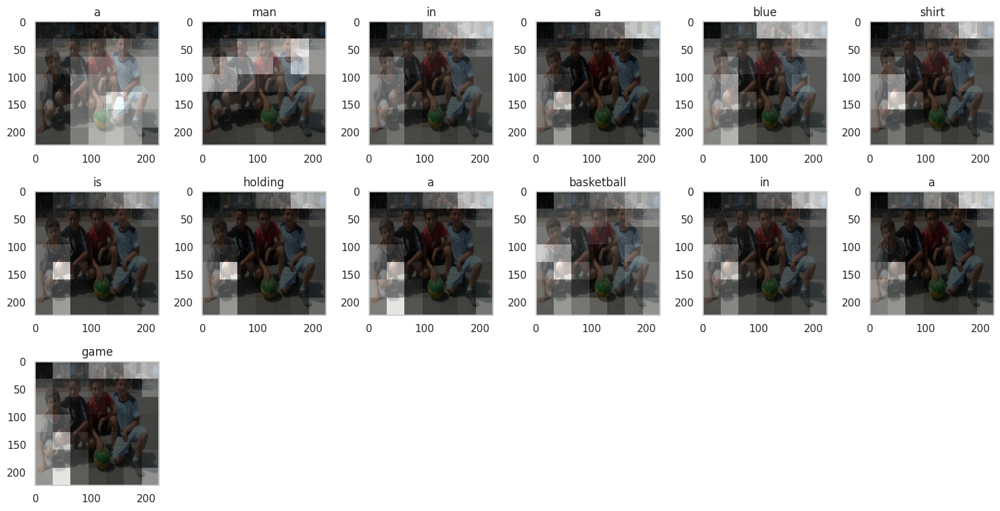

In [54]:
inference_sample(test_loader)

In [49]:
import nltk

# evaluate the model by calculating the BLEU score
def evaluate_model(df, model):
    sample_image_names = df['image'].unique()
    references = []
    candidates = []
    with torch.no_grad():
        for img_name in tqdm(sample_image_names, desc='Calculating BLEU-Scores'):
            img = Image.open(os.path.join(image_folder, img_name)).convert("RGB")
            img = test_transform(img)
            
            pred_caption, attns = predict_caption(model, img)
            all_captions = df.loc[df['image'] == img_name, 'caption'].to_list()
            all_captions = [vocab.tokenize(caption) for caption in all_captions]
            references.append(all_captions)
            candidates.append(pred_caption)
        
    BLEU1 = nltk.translate.bleu_score.corpus_bleu(references, candidates,weights=(1.0,0,0,0))
    BLEU2 = nltk.translate.bleu_score.corpus_bleu(references, candidates,weights=(0.5,0.5,0,0))
    BLEU3 = nltk.translate.bleu_score.corpus_bleu(references, candidates, weights=(0.33,0.33,0.33,0))
    BLEU4 = nltk.translate.bleu_score.corpus_bleu(references, candidates,weights=(0.25,0.25,0.25,0.25))

    print(f"BLEU-1 {BLEU1}")
    print(f"BLEU-2 {BLEU2}")
    print(f"BLEU-3 {BLEU3}")
    print(f"BLEU-4 {BLEU4}")
    return BLEU1, BLEU2, BLEU3, BLEU4

In [50]:
test_1, test_2, test_3, test_4 = evaluate_model(test_df, model)
val_1, val_2, val_3, val_4 = evaluate_model(val_df, model)
train_1, train_2, train_3, train_4 = evaluate_model(train_df, model)

Calculating BLEU-Scores: 100%|██████████| 1618/1618 [00:43<00:00, 37.41it/s]


BLEU-1 0.5314397224631396
BLEU-2 0.35849421587786245
BLEU-3 0.23216074406872433
BLEU-4 0.14726022432329325


Calculating BLEU-Scores: 100%|██████████| 1295/1295 [00:36<00:00, 35.34it/s]


BLEU-1 0.5328947368421053
BLEU-2 0.3555287497311401
BLEU-3 0.22903707628833264
BLEU-4 0.14229152531864633


Calculating BLEU-Scores: 100%|██████████| 5178/5178 [02:41<00:00, 32.00it/s]


BLEU-1 0.5604897566671818
BLEU-2 0.3941290328132996
BLEU-3 0.26985389021930145
BLEU-4 0.17824254119305746


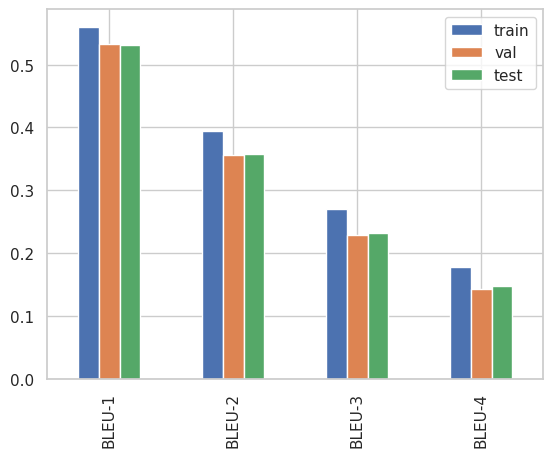

In [53]:
bleu_dict = {
    'train': {'BLEU-1': train_1, 'BLEU-2': train_2, 'BLEU-3': train_3, 'BLEU-4': train_4},
    'val' : {'BLEU-1': val_1, 'BLEU-2': val_2, 'BLEU-3': val_3, 'BLEU-4': val_4},
    'test': {'BLEU-1': test_1, 'BLEU-2': test_2, 'BLEU-3': test_3, 'BLEU-4': test_4},
}

pd.DataFrame(bleu_dict).plot(kind='bar')
plt.savefig("bleu_results.png")
plt.show()